In [2]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import time

In [3]:
scale = 0.5

In [4]:
def resize(frame, scale):
    return cv.resize(frame, (int(scale*frame.shape[1]), int(scale*frame.shape[0])))

In [15]:
cv.destroyAllWindows()
lb_videos = "videos/Tennis_LB_{}.mp4"
video = lb_videos.format(3)
cap = cv.VideoCapture(video)
frame_count = int(cap.get(cv.CAP_PROP_FRAME_COUNT))

ret, frame1 = cap.read()
frame1_gray = cv.cvtColor(frame1, cv.COLOR_BGR2GRAY)
#plt.imshow(frame1_hsv)
frame1_small = resize(frame1_gray, scale)

flow_hsv = np.zeros_like(resize(frame1, scale))
flow_hsv[...,1] = 255

In [19]:
class a:
    s = "sdfsdf{}sdf"

print(a.s.format("sdf"))
print(a.s)

sdfsdfsdfsdf
sdfsdf{}sdf


In [20]:
# COLLECT BALL DATA

cv.destroyAllWindows()
lb_videos = "videos/Tennis_SBCC_{}.mov"
video = lb_videos.format(2)
cap = cv.VideoCapture(video)
frame_count = int(cap.get(cv.CAP_PROP_FRAME_COUNT))

# frame#, x, y,
ball_loc_arr = np.array([[0,0,0]])

SKIP_FRAMES = 0
nextF = False
cur_frame = 0

def mouse_drawing(event, x, y, flags, params):
    global nextF
    global ball_loc_arr
    if event == cv.EVENT_LBUTTONDOWN:
#         print("Left click")
#         print(cur_frame,x,y)
        y+=1
       
      
        circles.append((x, y))
        ball_loc_arr = np.concatenate((ball_loc_arr, np.array([[cur_frame,x*2,y*2]]))) 
    if event == cv.EVENT_RBUTTONDOWN:
#         print("Right click")
        nextF = True
        
ret, frame = cap.read()
frame = resize(frame,0.5)
print(frame.shape)
cv.namedWindow("Frame", flags=cv.WINDOW_NORMAL)
cv.setMouseCallback("Frame", mouse_drawing)

circles = []
for i in range(SKIP_FRAMES):
    cap.read()
    cur_frame+=1

while True:
    
    if nextF:
#         print(nextF)
        ret, frame = cap.read()
        frame = resize(frame,0.5)
        circles = []
        cur_frame+=1
        if not ret:
            break
        nextF = False
    
    for center_position in circles:
        cv.circle(frame, center_position, 2, (0, 0, 255), -1)
    
    cv.imshow("Frame", frame)
#     cv.resizeWindow("Frame", 960, 540)
    
    key = cv.waitKey(1)
    if key == 27:
        break
    elif key & 0xFF == ord('q'):
        circles = []
cap.release()
cv.destroyAllWindows()


(540, 960, 3)


KeyboardInterrupt: 

In [ ]:
print(ball_loc_arr[1:])
np.savetxt("ball_pos_data/ball_pos_data_SBCC_2.csv", ball_loc_arr[1:],fmt="%i")

In [ ]:
# BIRDIE TRACKING

time.sleep(1)
i=0
was_bird_found = False
cur_pos = np.array([None,None])
cur_flow = np.array([None,None])
prev_pos = np.array([None,None])
prev_flow= np.array([None,None])
# while cap.isOpened():
for i in range(0):
    cap.read()
for i in range(frame_count):
    print("Frame #: " , i)
    i+=1
    if (i%2==0):
        pass
    ret, frame2 = cap.read()
    
    # figure out if it's empty
    if not ret:
        break
        
    #resize and make various images
    frame2_small_color = resize(frame2,scale)
    frame2_gray = cv.cvtColor(frame2, cv.COLOR_BGR2GRAY)
    frame2_small = resize(frame2_gray,scale)
    
    #thresholding
    ret, frame2_thresh = cv.threshold(frame2_small,0,255,cv.THRESH_BINARY+cv.THRESH_OTSU)
    
    #make flow
    flow = cv.calcOpticalFlowFarneback(frame1_small, frame2_small, None, 0.5, 3, 15, 3, 10, 1.2, 0)
    mag, ang = cv.cartToPolar(flow[...,0], flow[...,1])
    flow_hsv[...,0] = ang*180/np.pi/2
    flow_hsv[...,2] = cv.normalize(mag,None,0,255,cv.NORM_MINMAX)
    bgr = cv.cvtColor(flow_hsv,cv.COLOR_HSV2BGR)
    
    #detect birdie
    ret, frame2_thresh = cv.threshold(frame2_small_color.min(2),np.mean(frame2_small_color)+50,255,cv.THRESH_BINARY)
    kernel = np.ones((3,3),np.uint8)
    frame2_open = cv.morphologyEx(frame2_thresh, cv.MORPH_OPEN, kernel)
    num_labels, labels, stats, centroids = cv.connectedComponentsWithStats(frame2_open , 8 , cv.CV_32S)
    idx_comps = (stats[:, cv.CC_STAT_AREA] < 1000)
    idx_comps = np.logical_and(idx_comps, stats[:, cv.CC_STAT_AREA] > 100)
    idx_clusters_goodsize = np.arange(num_labels)[idx_comps]
    idx_clusters_birds = []
    
    if idx_clusters_goodsize.size > 0:
        for i in idx_clusters_goodsize:
            reg_idx = (labels == i)
            mean_flow = np.mean(mag[reg_idx])
            mean_color = np.mean(frame2_small_color.min(2)[reg_idx])
            if mean_flow > 8:
                idx_clusters_birds.append(i)
    
    for i in idx_clusters_birds:
        cv.circle(frame2_small_color, (int(centroids[i,0]), int(centroids[i,1])), 10, (255,0,0), 2)
    
    if (len(idx_clusters_birds) == 1):
        was_bird_found=True
        
        cluster_bird = idx_clusters_birds[0]
        cur_pos[:] = [int(centroids[cluster_bird,0]), int(centroids[cluster_bird,1])]
        reg_idx = (labels == cluster_bird)
        cur_flow[:] = np.mean(flow[reg_idx],0)
    elif (len(idx_clusters_birds) > 1):
        was_bird_found=True
        
        expected_pos = prev_pos+prev_flow
        centroids_good = centroids.astype(int)[idx_clusters_birds]
        centroids_good = centroids_good-expected_pos
        distances = centroids_good[:,0] * centroids_good[:,0] + centroids_good[:,1] * centroids_good[:,1]
        cluster_bird = idx_clusters_birds[np.where(distances == np.min(distances))[0][0]]
        cur_pos[:] = [int(centroids[cluster_bird,0]), int(centroids[cluster_bird,1])]
        reg_idx = (labels == cluster_bird)
        cur_flow[:] = np.mean(flow[reg_idx],0)
    else:
        if (was_bird_found):
            cur_pos[:] = prev_pos+prev_flow
        else:
            cur_pos[:] = None
        was_bird_found=False
    print(cur_flow)
    if( cur_pos[0] != None):     
        cv.circle(frame2_small_color, (int(cur_pos[0]), int(cur_pos[1])), 5, (0,0,255), 2)
    if(prev_pos[0] != None):
        cv.circle(frame2_small_color, (int(prev_pos[0]+prev_flow[0]), int(prev_pos[1]+prev_flow[1])), 5, (0,255,0), 2)
    prev_pos = cur_pos.copy()
    prev_flow = cur_flow.copy()
    
    """"
    idx_of_movement = (mag > 8)
    idx_of_light = (frame2_small > 190)
    idx_of_color = (frame2_small_color.min(2)>190)
    idx = np.logical_and(idx_of_color, idx_of_movement)
#     frame2_small_color[idx,:] = 0
    row, col = np.where(idx)
    if (row.size>0):
        row_mean = int(row.mean())
        col_mean = int(col.mean())
#         cv.circle(frame2_small_color, (col_mean, row_mean), 10, (0,0,255), 2)
    """
#     print("Birdie Pixels Found: " , sum(sum(idx)))
#     print("Mean Position: ", row_mean, " ", col_mean)
#     print("Brightest Pixels: ", np.where(frame2_small_color.min(2)==np.amax(frame2_small_color.min(2))))
    
    #show video in new window
    cv.imshow('frame', frame2_small)
    cv.imshow('flow', bgr)
    if cv.waitKey(1) == ord('q'):
        break
    
    #histogram
    step = 5
    mag_ang = np.zeros((mag[0::step,0::step].shape[0]*mag[0::step,0::step].shape[1], 2))
    mag_ang[:,0] = np.reshape(mag[0::step,0::step],mag[0::step,0::step].shape[0]*mag[0::step,0::step].shape[1])
    mag_ang[:,1] = np.reshape(ang[0::step,0::step],ang[0::step,0::step].shape[0]*ang[0::step,0::step].shape[1])
    idx_hist = (mag_ang[:, 0] > 5)
    mag_ang=mag_ang[idx_hist, :]
    
    #display in output
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
    fig.set_size_inches(22,5)
    ax1.hist2d(mag_ang[:,0], mag_ang[:,1], bins=30)
    ax2.imshow(cv.cvtColor(frame2_small_color, cv.COLOR_BGR2RGB))
    ax3.imshow(frame2_open)
    plt.show()
    
    #do the swticharoo
    frame1_small=frame2_small
    
        
cap.release()
cv.destroyAllWindows()
cv.destroyAllWindows()

plt.imshow(bgr)

In [119]:
cv.destroyAllWindows()
lb_videos = "videos/Tennis_NP_{}.mov"
video = lb_videos.format(1)
cap = cv.VideoCapture(video)
frame_count = int(cap.get(cv.CAP_PROP_FRAME_COUNT))

ret, frame1 = cap.read()
frame1_gray = cv.cvtColor(frame1, cv.COLOR_BGR2GRAY)
#plt.imshow(frame1_hsv)
frame1_small = resize(frame1_gray, scale)

flow_hsv = np.zeros_like(resize(frame1, scale))
flow_hsv[...,1] = 255


frame # 0
[[      0       0    1920    1080 2039028]
 [   1287      23       2       3       6]
 [   1291      65       2       7      14]
 [    693     112       2       3       6]
 [    116     187       4       5      14]
 [    105     191       2       2       4]
 [      0     193     131      69    5325]
 [    164     193       2       2       4]
 [    113     194       4       6      17]
 [    145     195       6       3      14]
 [    156     196       4       4      10]
 [    119     201       9       4      23]
 [    163     200       4       5      11]
 [    111     212       3       3       7]
 [    123     217       2       2       4]
 [    126     217       2       2       4]
 [    124     221       5       3      13]
 [    139     225       5       3      11]
 [    121     227      17      19     173]
 [    132     226       3       2       6]
 [    119     229       2       4       8]
 [    146     229       2       2       4]
 [    129     248       2       5      10]
 

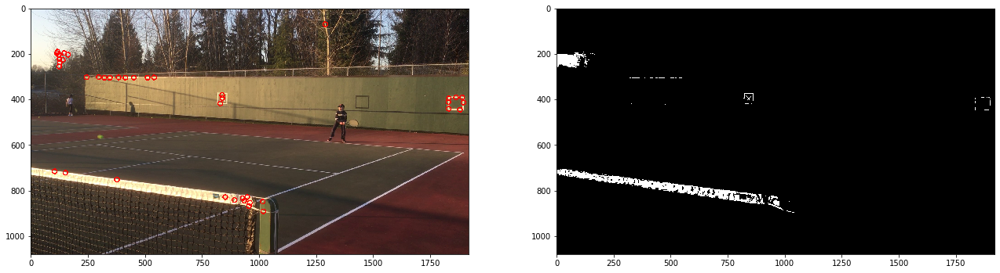

frame # 1
[[      0       0    1920    1080 2038993]
 [   1287      25       2       2       4]
 [   1291      66       2       8      16]
 [    101     185       2       2       4]
 [    116     187       3       3       8]
 [    118     191       3       2       6]
 [    112     193       5       7      23]
 [    145     195       9       3      21]
 [    126     196       2       2       4]
 [    156     196       4       4      10]
 [      0     201     105      61    4891]
 [     88     200      42      27     399]
 [    118     201      10       5      28]
 [    164     200       3       2       6]
 [    227     201       2       3       6]
 [    111     213       3       2       6]
 [    120     217       2       2       4]
 [    124     217       2       2       4]
 [    134     217       2       2       4]
 [    125     222       4       2       8]
 [    122     227      16      20     168]
 [    132     227       2       2       4]
 [    138     226       7       3      15]
 

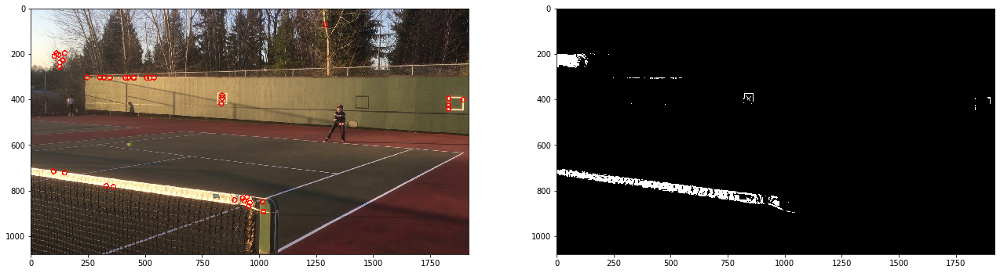

frame # 2
[[      0       0    1920    1080 2039003]
 [   1287      25       2       2       4]
 [   1291      69       2       6      12]
 [   1297     105       2       2       4]
 [    693     115       2       2       4]
 [    115     187       4       6      18]
 [    143     193      11       7      36]
 [     85     194       2       2       4]
 [    113     195      15      12      49]
 [    126     197       4       4      12]
 [    156     198       2       2       4]
 [    161     199       2       2       4]
 [      0     200     131      63    5136]
 [    163     200       4       5      11]
 [    177     200       2       2       4]
 [    226     202       2       2       4]
 [    111     213       2       3       6]
 [    122     218       9       2      18]
 [    124     222       5       3      12]
 [    133     227       2       2       4]
 [    139     226       5       3      11]
 [    122     228      16      19     168]
 [    146     229       2       2       4]
 

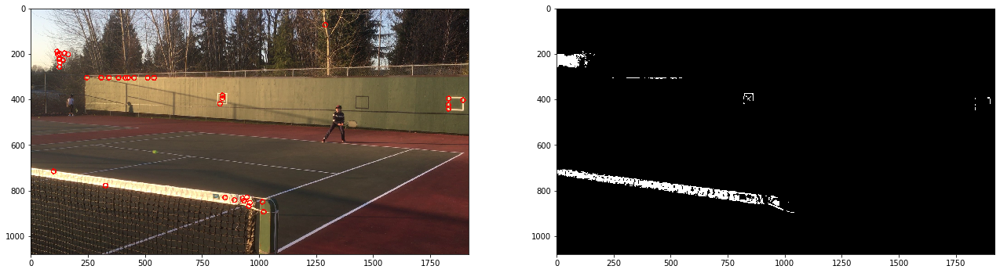

frame # 3
[[      0       0    1920    1080 2038887]
 [   1285      23       4       6      18]
 [   1289      58       2       5      10]
 [   1297     105       2       3       6]
 [    693     115       2       2       4]
 [    143     193      12       7      40]
 [     85     195       2       2       4]
 [    112     194      16      13      60]
 [    157     195       2       2       4]
 [    126     197       3       2       6]
 [    155     198       3       3       7]
 [    160     199       3       3       8]
 [      0     201     103      62    4869]
 [     86     201      44      26     413]
 [    164     201       3       2       6]
 [    226     201       2       3       6]
 [    171     202       2       2       4]
 [    111     214       2       2       4]
 [    123     218       2       2       4]
 [    124     222       5       3      14]
 [    133     227       2       2       4]
 [    138     226       6       3      16]
 [    121     228      17      20     170]
 

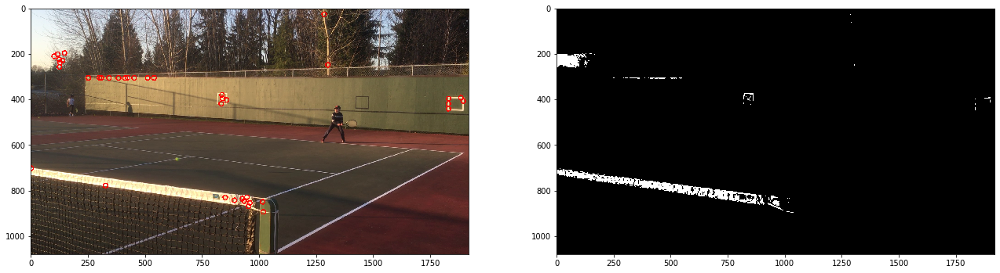

frame # 4
[[      0       0    1920    1080 2038882]
 [   1285      21       4      10      29]
 [   1286      42       2       2       4]
 [   1287      45       2       4       8]
 [   1297     103       2       6      12]
 [    117     191       2       3       6]
 [    105     193       2       2       4]
 [    139     193      20       7      63]
 [    111     194       2       2       4]
 [    126     195       2       4       8]
 [    111     197      16      10      56]
 [    155     199       3       2       6]
 [    159     199       7       6      21]
 [      0     200     129      64    5312]
 [    226     201       2       4       8]
 [    171     203       2       2       4]
 [    136     212       2       2       4]
 [    111     215       4       3      10]
 [    119     218       2       2       4]
 [    124     223       5       2      10]
 [    138     227       6       3      13]
 [    121     229      17      19     168]
 [    132     228       2       2       4]
 

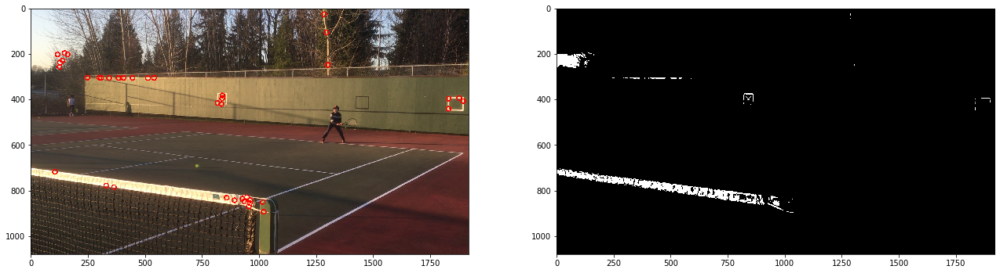

frame # 5
[[      0       0    1920    1080 2038938]
 [   1285      23       4       8      24]
 [   1287      45       2       3       6]
 [   1297     105       2       4       8]
 [    117     191       2       3       6]
 [    105     193       2       2       4]
 [    139     193       2       2       4]
 [    142     193      12       7      47]
 [    112     195      15      13      63]
 [    126     195       4       6      12]
 [    155     195       4       3      10]
 [    159     197       7       7      26]
 [    155     199       3       2       6]
 [      0     201     130      63    5225]
 [    226     201       3       3       8]
 [    171     203       2       2       4]
 [    111     215       4       4      12]
 [    122     219       4       2       8]
 [    128     219       2       2       4]
 [    124     223       4       3      12]
 [    138     227       6       3      14]
 [    121     229      16      19     167]
 [    119     231       2       3       6]
 

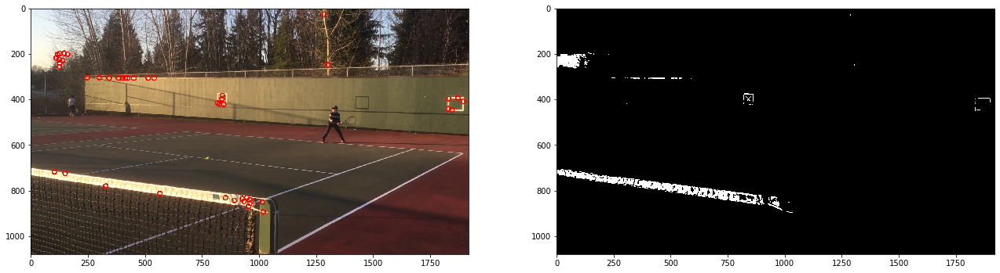

frame # 6
[[      0       0    1920    1080 2039221]
 [   1285      29       2       2       4]
 [   1297     105       2       6      12]
 [    117     192       2       3       6]
 [    139     193      27      11     107]
 [     79     195       2       2       4]
 [    111     195      16      14      64]
 [    126     196       2       4       8]
 [      0     199     129      66    4994]
 [    111     200       2       2       4]
 [    226     201       3       5      12]
 [    136     213       2       2       4]
 [    111     216       3       3       8]
 [    122     219       3       2       6]
 [    111     222       2       2       4]
 [    124     224       4       2       8]
 [    121     229      16      20     169]
 [    131     229       3       2       6]
 [    138     228       5       2      10]
 [    119     232       2       2       4]
 [    120     246       2       2       4]
 [    129     252       2       3       6]
 [    124     256       6       5      17]
 

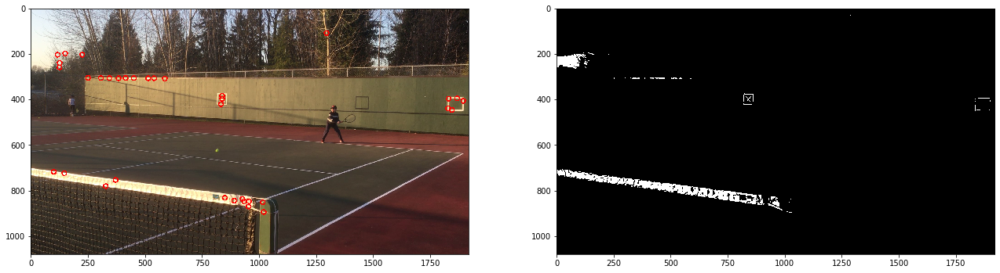

In [120]:

fgbg = cv.createBackgroundSubtractorMOG2(detectShadows=False)

for i in range(7):
    print("frame #", + i)
    ret, frame = cap.read()
    frame_rgb = cv.cvtColor(frame, cv.COLOR_BGR2RGB)
    frame_hsv = cv.cvtColor(frame, cv.COLOR_BGR2HSV)
    frame_gray = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
    frame_thresh = np.zeros((frame_rgb.shape[0],frame_rgb.shape[1]))
    frame_zoomedin = frame_rgb[475:525,475:525,:]

    #print(frame_hsv[475+18:475+22,500:505,:])
    #h: 25-45, s:45-65, v: 250-255
    #https://stackoverflow.com/questions/51229126/how-to-find-the-red-color-regions-using-opencv
    
    fgmask = fgbg.apply(frame)
    
    #filter based on hsv
    idx_hue_bright = np.logical_and((frame_hsv[:,:,0]>=20), (frame_hsv[:,:,0]<=45))
    idx_sat_bright = np.logical_and((frame_hsv[:,:,1]>=25), (frame_hsv[:,:,1]<=170))
    idx_val_bright = (frame_hsv[:,:,2]>=230)
    idx_hsv_bright = np.logical_and(np.logical_and(idx_hue_bright, idx_sat_bright), idx_val_bright)
    frame_thresh[idx_hsv_bright] = 255

    kernel = np.ones((2,2),np.uint8)
    frame_open = cv.morphologyEx(frame_thresh, cv.MORPH_OPEN, kernel)
    num_labels, labels, stats, centroids = cv.connectedComponentsWithStats(frame_open.astype(np.uint8) , 8 , cv.CV_32S)
    
    idx_good_size = np.logical_and((stats[:,cv.CC_STAT_AREA ]> 10), stats[:,cv.CC_STAT_AREA] <1000)
    centroids_good_size = centroids[idx_good_size]
    
    print(stats)
    
    for i in range(centroids_good_size.shape[0]):
        
            cv.circle(frame_rgb, (int(centroids_good_size[i,0]), int(centroids_good_size[i,1])), 10, (255,0,0), 3)
        

    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(22,8)
# plt.imshow(frame_open,cmap = "gray")
# plt.figure()
# plt.imshow(frame_zoomedin)
    ax1.imshow(frame_rgb)
    ax2.imshow(frame_open, cmap="gray")
    plt.show()
    
    if (stats.shape[0]==1):
        break

[[[ 30 130 174]
  [ 33 149 217]
  [ 33 138 235]
  [ 34 137 222]]

 [[ 30 103 220]
  [ 33 135 239]
  [ 33 140 231]
  [ 34 143 212]]

 [[ 31 107 234]
  [ 32 133 236]
  [ 32 144 218]
  [ 34 139 196]]

 [[ 31 111 225]
  [ 32 143 220]
  [ 32 155 203]
  [ 34 144 189]]]


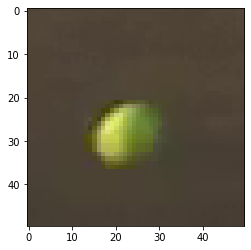

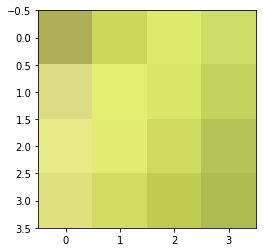

In [127]:
# ZOOM IN ON FRAMES

center1row = 620
center1col = 820

center2row = 27
center2col = 20

frame_zoomed = frame_rgb[center1row-25:center1row+25,center1col-25:center1col+25,:]
frame_zoomed_hsv = cv.cvtColor(frame_zoomed, cv.COLOR_RGB2HSV)

print(frame_zoomed_hsv[center2row-2:center2row+2,center2col-2:center2col+2,:])

plt.imshow(frame_zoomed)
plt.figure()
plt.imshow(frame_zoomed[center2row-2:center2row+2,center2col-2:center2col+2,:])


/Users/Moishe/anaconda3/envs/cvd/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()


AttributeError: 'NoneType' object has no attribute 'shape'

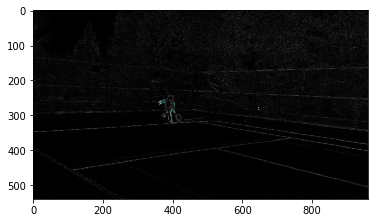

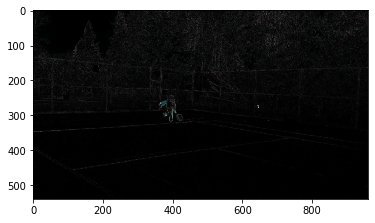

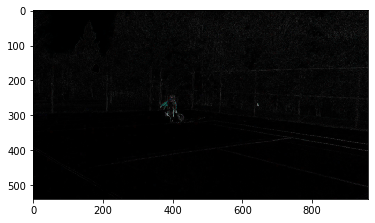

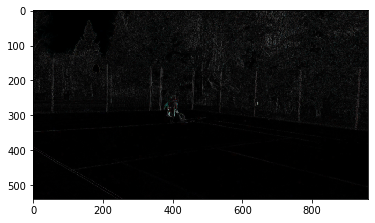

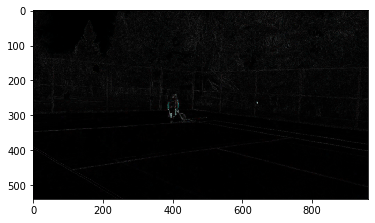

...

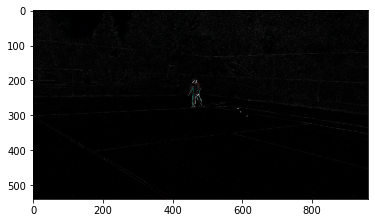

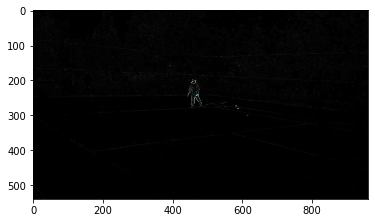

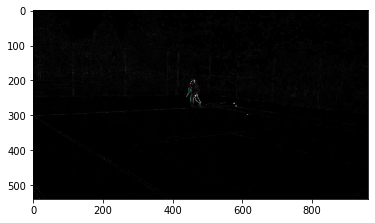

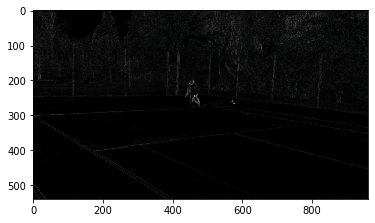

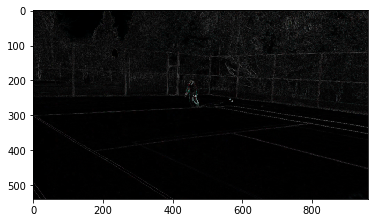

Error in callback <function flush_figures at 0x11cd80560> (for post_execute):


KeyboardInterrupt: 

In [225]:
# CALCULATE FRAME DIFFERENCES

start = 155
stop = 160
ret, frame1 = cap.read()
frame1 = resize(frame1, scale)

for i in range(frame_count):
    ret, frame2_small_color = cap.read()
    frame2_small_color = resize(frame2_small_color, scale)
    frame_diff = cv.absdiff(frame2_small_color,frame1)
    frame_diff_med = cv.medianBlur(frame_diff, 3)
    plt.figure()
    plt.imshow(np.abs(frame_diff_med), cmap="gray")
    #print(np.where(new>10))
    frame1 = frame2_small_color.copy()

In [ ]:
kernel = np.ones((3,3),np.uint8)
ret, frame2_small_color = cap.read()
frame2_small_color = resize(frame2_small_color, scale)
cv.circle(frame2_small_color, (400, 25), 5, (0,0,0), -1)
plt.imshow(frame2_small_color)

ret, frame2_thresh = cv.threshold(frame2_small_color.min(2),np.mean(frame2_small_color)+50,255,cv.THRESH_BINARY)
frame2_open = cv.morphologyEx(frame2_thresh, cv.MORPH_OPEN, kernel)
num_labels, labels, stats, centroids = cv.connectedComponentsWithStats(frame2_open , 8 , cv.CV_32S)
idx_comps = (stats[:, cv.CC_STAT_AREA] < 1000)
idx_comps = np.logical_and(idx_comps, stats[:, cv.CC_STAT_AREA] > 100)
clusters_good = np.arange(num_labels)[idx_comps]


print("good sized clusters: " , clusters_good)
for i in clusters_good:
    reg_idx = (labels == i)
    reg_row, reg_col = np.where(reg_idx)
    if (frame2_open[reg_row[0], reg_col[0]] == 0):
        idx_comps[i]= False

# print("good centers: " , centroids[idx_comps])
clusters_good = np.arange(num_labels)[idx_comps]
print("good sized and colored clusters: ", clusters_good)
print(idx_comps)



print(centroids.astype(int))
print(stats)
print(num_labels)

plt.figure()
plt.imshow(frame2_open, cmap="gray")
plt.figure()
plt.imshow(frame2_small_color-frame1)
plt.figure()
plt.imshow(frame2_thresh-frame1_thresh)
print(frame2_thresh-frame1_thresh)
frame1 = frame2_small_color.copy()
frame1_thresh = frame2_thresh.copy()

In [ ]:
frame2_gray = cv.cvtColor(frame2, cv.COLOR_BGR2GRAY)
fig = plt.figure()
frame2_small=resize(frame2_gray,scale)

plt.imshow(frame2_gray, cmap="gray")

row, col = np.mgrid[0:frame2_small.shape[0],0:frame2_small.shape[1]]
row = row.reshape(frame2_small.shape[0],frame2_small.shape[1],1)
col = col.reshape(frame2_small.shape[0],frame2_small.shape[1],1)


frame2_xy = frame2_small.reshape(frame2_small.shape[0],frame2_small.shape[1],1)                                
frame2_xy = np.concatenate((frame2_xy, row),axis=2)
frame2_xy = np.concatenate((frame2_xy, col),axis=2)

frame2_xy_aslist = frame2_xy.reshape(frame2_small.shape[0]*frame2_small.shape[1],3)

frame2_aslist = frame2_small.reshape(frame2_small.shape[0]*frame2_small.shape[1])

idx_of_movement = (mag > 20)
idx_of_light = (frame2_small > 200)
idx = np.logical_and(idx_of_light, idx_of_movement)

frame2_small[idx] = 0

print(idx_of_light.shape)
# print(sum(bool(x) for x in idx_of_light))
# print(sum(idx_of_light))
frame2_small.shape
plt.figure()
plt.imshow(frame2_aslist.reshape(frame2_small.shape[0],frame2_small.shape[1]), cmap="gray")

In [ ]:
step = 5
mag_ang = np.zeros((mag[0::step,0::step].shape[0]*mag[0::step,0::step].shape[1], 2))
mag_ang[:,0] = np.reshape(mag[0::step,0::step],mag[0::step,0::step].shape[0]*mag[0::step,0::step].shape[1])
mag_ang[:,1] = np.reshape(ang[0::step,0::step],ang[0::step,0::step].shape[0]*ang[0::step,0::step].shape[1])
mag_ang[]

In [ ]:
step = 5
# print(np.reshape(mag,(mag.shape[0]*mag.shape[1])))
# print(ang.shape)
#print(flow_hsv[0::step,0::step].shape)

mag[0::step,0::step].shape, ang[0::step,0::step].shape


num, bins = np.histogramdd(mag_ang)
print(num.astype(int))
print(bins[0].astype("int"))
print(bins[1].astype("float16"))

a, b, c, img = plt.hist2d(mag_ang[:,0], mag_ang[:,1], bins=30)
plt.show()
# print(num)
# print(bins.astype(int))

In [ ]:
import numpy as np
import cv2
import sys
## sys.path.append( r'/home/yakov/Github/opencv/samples/python' )
#sys.path.append( r'C:\Users\yakov\Git\Github\opencv\samples\python' )

#import opt_flow as of

def my_draw_flow(img, flow, **kwargs):

    step = kwargs.get( 'step', 5 )
    gr_thresh = kwargs.get( 'gr_thresh', 40 )
    max_val = kwargs.get( 'max_val', 100 )
    max_flow_val = kwargs.get( 'max_flow_val', 0 )

    max_flow_val = min( max_flow_val, max_val )
    red = max( 0, max_flow_val - gr_thresh ) / ( max_val - gr_thresh )
    assert red >= 0.0 and red <= 1.0
    green = 1 - red

    red_int = int( 255 * red )
    green_int = int( 255 * green )

    h, w = img.shape[:2]
    y, x = np.mgrid[step/2:h:step, step/2:w:step].reshape(2,-1).astype(int)
    fx, fy = flow[y,x].T
    
    lines = np.vstack([x, y, x+fx, y+fy]).T.reshape(-1, 2, 2)
    lines = np.int32(lines + 0.5)
    vis = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    cv2.polylines(vis, lines, 0, (0, green_int, red_int))
    for (x1, y1), (x2, y2) in lines:
        cv2.circle(vis, (x1, y1), 1, (0, green_int, red_int), -1)
    return vis


if __name__ == '__main__':

    video_name1 = 'bird.avi'
    video_name1 = 'brazil.mp4'
    video_name1 = 'new-orleans.mp4'
    video_name1 = 'new-orleans-short-edited.mp4'
    video_name = 'IMG_3150.MOV'
    
    cam = cv2.VideoCapture( video_name )
    ret, prev = cam.read()
    prevgray = cv2.cvtColor(prev, cv2.COLOR_BGR2GRAY)
    prevgray = cv2.resize(prevgray, (int(0.4*prevgray.shape[1]), int(0.4*prevgray.shape[0])))
    show_hsv = False

    height, width, layers = prev.shape
	
    root = video_name.split( '.' )[0] + '_'
    out_flow = cv2.VideoWriter(root + "vector_flow.avi", cv2.VideoWriter_fourcc(*"XVID"), 30,(width,height))
    out_hsv = cv2.VideoWriter(root + "hsv_flow.avi", cv2.VideoWriter_fourcc(*"XVID"), 30,(width,height))

    ## while True:
    window = []
    window_size = 10
    for i in range( 100000 ):
        ret, img = cam.read()
        if not ret:
            break

        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        gray = cv2.resize(gray, (int(0.4*gray.shape[1]), int(0.4*gray.shape[0])))
        flow = 10*cv2.calcOpticalFlowFarneback(prevgray, gray, None, 0.5, 3, 15, 3, 5, 1.2, 0)

        max_flow_val = 0
        if i > 5:
            window.insert( 0, flow.max() )
            if len( window ) > window_size:
                window.pop()
            max_flow_val = max( window )

        prevgray = gray

        cur_flow = my_draw_flow(gray, flow, max_flow_val= max_flow_val)
        #cur_hsv = of.draw_hsv(flow)
		
        out_flow.write( cur_flow )
        #out_hsv.write( cur_hsv )
		
        cv2.imshow('flow', cur_flow)
		
        #if show_hsv:
            #cv2.imshow('flow HSV', cur_hsv)

        ch = cv2.waitKey(5)
        if ch == 27:
            break
        if ch == ord('1'):
            show_hsv = not show_hsv
            print('HSV flow visualization is', ['off', 'on'][show_hsv])
    cv2.destroyAllWindows()
    out_flow.release()
    out_hsv.release()
